In [1]:
!nvidia-smi

Wed Jan  7 17:10:57 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti     Off |   00000000:B2:00.0 Off |                  N/A |
| 22%   21C    P8             19W /  250W |    2602MiB /  11264MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
# NOTE!
# this is for a multi-gpu setup. we basically set which GPU is visible for the program.
# if you only have one GPU (most likely the case ;) ), make sure this is set to "0"!
# or remove this line completely!
# otherwise you may accidentally make your GPU "invisible" to the program!
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Score-based Generative Model

In [3]:
import os
os.chdir("/home/exgr5/LGM/Assignments")
print(os.getcwd())
import numpy as np
import torch
from matplotlib import pyplot as plt
from torch import nn

from lgm.common import count_parameters, plot_learning_curves, EMA, make_animation, cosine_decay_warmup
from lgm.data import get_datasets_and_loaders, Normalize
from lgm.evaluation import get_classifier, fid, inception_score_with_features, precision_recall
from lgm.layers import CNNBody, ConvBlockPrenorm
from lgm.score import ScoreTrainer, ScoreModel, generate_omega
from lgm.visualization import plot_image_grid

torch.set_float32_matmul_precision('high')
torch.backends.cudnn.benchmark = True

/home/exgr5/LGM/Assignments


Shape/dtype of batch X [N, C, H, W]: torch.Size([256, 1, 32, 32]), torch.float32
Shape/dtype of batch y: torch.Size([256]), torch.int64


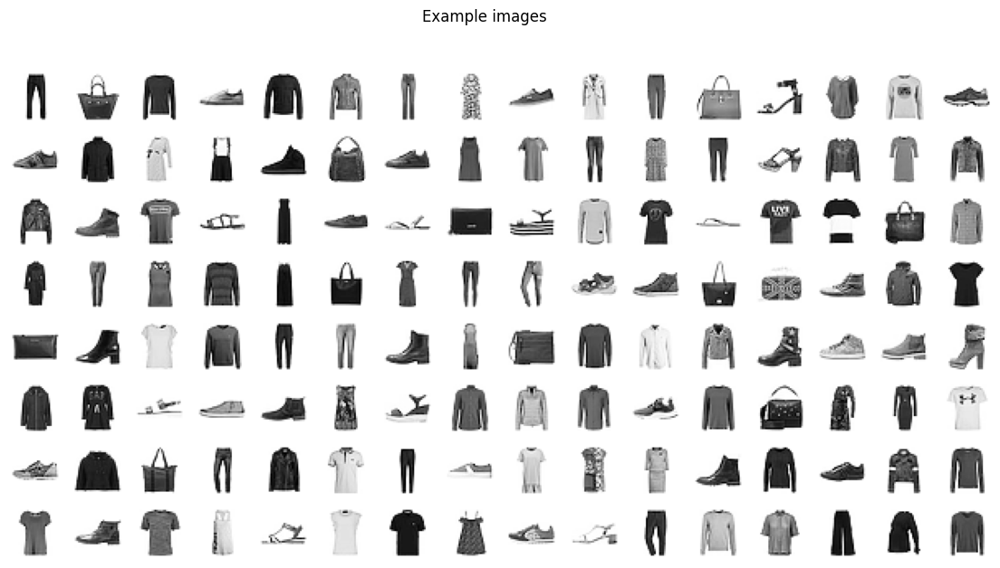

In [4]:
data = "fashion"
batch_size = 256

train_data, test_data, train_dataloader, test_dataloader = get_datasets_and_loaders(data, batch_size, num_workers=16)

## Setting up multiple noise scales

To successfully implement denoising score matching, we have to incrementally reduce the noise in the data. This raises some big questions:

- At what maximum noise level do we start?
- What minimum noise level is our target?
- How many noise scales do we want/how quickly reduce the noise?
- What kind of shape should the noise reduction have?

The original paper by Song et al. proposes some arbitrary values for simple datasets like 32x32 images:
- Maximum noise level has a standard deviation of 1 for image data in [0, 1].
- Minimum noise level is 0.01.
- 10 noise levels.
- Geometric progression of noise.

Their follow-up implements more principled rules to make these choices. These are implemented below. **You can ignore them at first.** Rather, you may jump ahead to the cells that define `max_noise = 1.` and `n_noise_scales = 10` etc. This implements the simple values listed above. We can improve this later.

### Maximum noise $\sigma$
First off, we need the maximum euclidean distance between data points. Computing the distance between _all_ data points would take a long time, so we make a lazy approximation and compute the distance only between elements in each batch. This should at least get us in the right ballpark.

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
max_distance_so_far = 0.

for ind, (input_batch, _) in enumerate(train_dataloader):
    flat_batch = input_batch.view(input_batch.shape[0], -1).to(device)
    all_distances = torch.sqrt(((flat_batch[None] - flat_batch[:, None])**2).sum(dim=-1))
    max_distance_here = all_distances.max().item()
    max_distance_so_far = np.maximum(max_distance_here, max_distance_so_far)
    if not ind % 10:
        print(ind, max_distance_so_far)

0 19.876808166503906
10 20.39610481262207
20 20.61553955078125
30 20.61553955078125
40 20.91420555114746
50 21.918642044067383
60 21.918642044067383
70 21.918642044067383
80 21.918642044067383
90 21.918642044067383
100 21.918642044067383
110 21.918642044067383
120 21.918642044067383
130 21.918642044067383
140 21.918642044067383
150 21.918642044067383
160 21.918642044067383
170 21.918642044067383
180 21.918642044067383
190 21.918642044067383
200 21.918642044067383
210 21.918642044067383
220 21.918642044067383
230 21.918642044067383


### Number of scales
Now we try to figure out how many noise scales to use. The paper proposes computing the below formulas to get the value `C`. This depends on the data dimensionality (which is fixed) and $\gamma$, the growth rate between successive noise levels. As such, this should be a number (slightly) larger than 1.
You will need to just plug in some values for `desired_gamma` and see what `C` comes out. Ideally, you want this to be close to 1, but this will often lead to a huge number of noise levels, in which case you might aim for `C = 0.5` or similar as a compromise.

In [6]:
from scipy import stats

d = int(np.prod(input_batch.shape[1:]))
desired_gamma = 1.066

upper_limit = np.sqrt(2*d) * (desired_gamma - 1) + 3*desired_gamma
lower_limit = np.sqrt(2*d) * (desired_gamma - 1) - 3*desired_gamma

c_value = stats.norm.cdf(upper_limit) - stats.norm.cdf(lower_limit)

print(f"With gamma {desired_gamma}, C value is {c_value:.3f}. Should be close to 1, or at least 0.5 or higher! Too low? Make gamma smaller!")
if c_value < 0.5:
    print("Warning! C seems small :(")

With gamma 1.066, C value is 0.584. Should be close to 1, or at least 0.5 or higher! Too low? Make gamma smaller!


### Geometric Progression
Now we can create a suitable noise scale. We start with a desired `min_noise`, which will be the noise level at the lowest scale. This should be small enough as to be essentially invisible. A common choice is 0.01, but this can still be noticeable especially for datasets with many blank spaces (like the background in MNIST). For this reason, you could use a smaller value here.
However, the typical generation function for score-based models includes an explicit _denoising_ step that should make 0.01 work great already.

**Note:** We fix the value of `max_noise` here. You could also use `max_distance_so_far`.
But this is a little brittle since each time you run the above, the random batches will lead to slightly different results.
As such, it's better to set this manually for reproducibility.
Just remember that **you will have to change this** `max_noise` for different datasets!

In [7]:
min_noise = 0.01
max_noise = 22
noise_scales_test = [min_noise]
while noise_scales_test[-1] < max_noise:
    if desired_gamma <= 1:
        raise ValueError("Gamma must be larger than 1")
    noise_scales_test.append(noise_scales_test[-1] * desired_gamma)

print(f"Need at least {len(noise_scales_test)} noise levels to reach gamma {desired_gamma}!")

Need at least 122 noise levels to reach gamma 1.066!


For reasons of aesthetics, you might want to choose a round number for the noise levels. For example, for the FashionMNIST example I get slightly below 200 noise levels. So I just choose 200.

In [8]:
n_noise_scales = 200
noise_scales = np.geomspace(max_noise, min_noise, n_noise_scales, dtype=np.float32)
true_gamma = noise_scales[0] / noise_scales[1]
print(f"With {n_noise_scales} noise scales, gamma is {true_gamma}, should be {desired_gamma} or lower! Too high? Make n_noise_scales larger!")

With 200 noise scales, gamma is 1.0394320487976074, should be 1.066 or lower! Too high? Make n_noise_scales larger!


With `geomspace`, the result is always a geometric progression. Following the notation in the paper, the lowest index is the highest amount of noise.

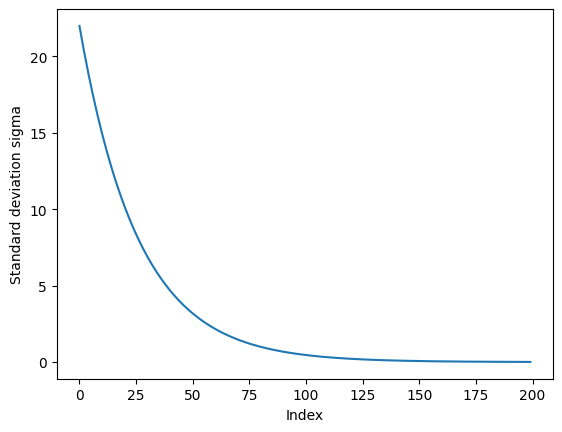

In [9]:
plt.plot(noise_scales)
plt.xlabel("Index")
plt.ylabel("Standard deviation sigma")
plt.show()

### Sampling parameters
Finally, we have to figure out the step size for the Langevin sampler. There is again some arcane formula from the paper for this. You will just have to choose some value for `epsilon`, as well as how many sampling steps _per noise level_ you can afford. The total number of sampling steps is just the number of noise levels times the steps per level.

You should probably try to have _at least_ 2-3 steps per noise level, else the sampling often doesn't work properly. The procedure here should be: Choose `t_per_noise_scale` as high as you can afford in terms of computation. Then play with `epsilon` until the `some_value` parameter is *as close as possible* to 1. We really mean it: if 0.000003 gives you a value close to 1, but 0.000005 is slightly closer, it may result in _much_ betters samples.
A simple method is:
- Start with whatever value for `epsilon`. Say, 0.0001. Record the `some_value`.
- Add a 0 to `epsilon` (0.00001) and check the result again.
- If the result got better, add another 0 and try again. Do this until the value starts increasing (moving away from 1) again.
- Revert to the optimal number of 0s. Now try changing the significant digit, i.e. try a 2 at the end instead of a 1. If it improves, try a 3, then 4, etc.
- Do this until the `some_value` starts increasing.
- Keep whatever digit got you the best value.
- Technically you could now move on to the next digits. E.g. if you found 0.000007 to be the best, and both 8 and 6 worse, it may be that the actual best value is 0.0000075, or something else in between.
- But just going to one significant digit should be enough for decent samples.

Note: `t_per_noise_scale=50` is intended for the basic schedule with just 10 levels.
But in general, you will likely need a couple hundred steps in total for good samples.

In [10]:
def crazy_formula_from_paper(gamma, t, eps):
    final_sigma_square = noise_scales[-1]**2
    first = (1 - (eps / final_sigma_square))**(2*t)
    second = gamma**2 - 2*eps / (final_sigma_square - final_sigma_square * (1 - eps/final_sigma_square)**2)
    third = 2*eps / (final_sigma_square - final_sigma_square * (1 - eps/final_sigma_square)**2)
    
    return first*second + third


t_per_noise_scale = 100
t_total = n_noise_scales * t_per_noise_scale

epsilon = 0.00000168
some_value = crazy_formula_from_paper(true_gamma, t_per_noise_scale, epsilon)

print(f"The thingy value is {some_value}! It should be !maximally! close to 1! If it's not, try playing around with the epsilon value.\n")
print(f"{t_per_noise_scale} steps per noise level and {n_noise_scales} noise levels -> {t_total} sampling steps in total!")

The thingy value is 1.0108994245529175! It should be !maximally! close to 1! If it's not, try playing around with the epsilon value.

100 steps per noise level and 200 noise levels -> 20000 sampling steps in total!


### Trying it out
Finally, we can get a visual impression of what this "noisification" looks like. We plot a couple of data samples with various noise levels. You should be able to see the data "emerge" from the noise.
The goal of our model will be to learn this process.

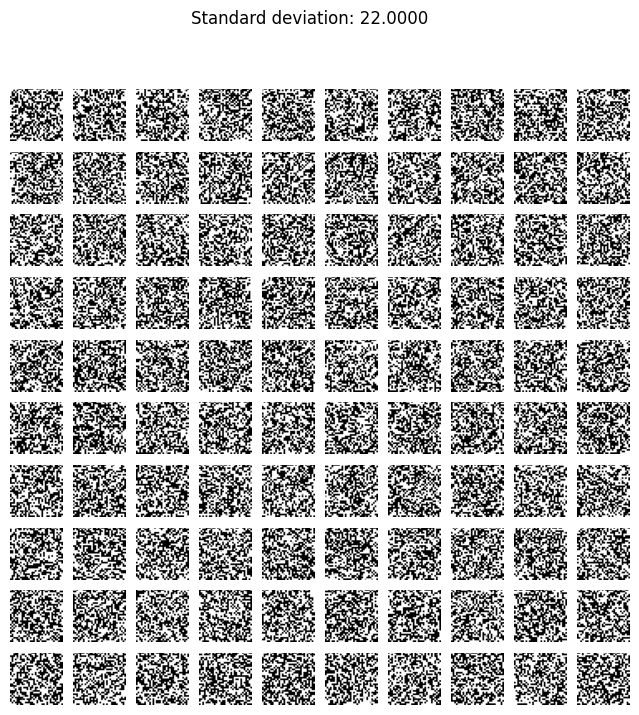

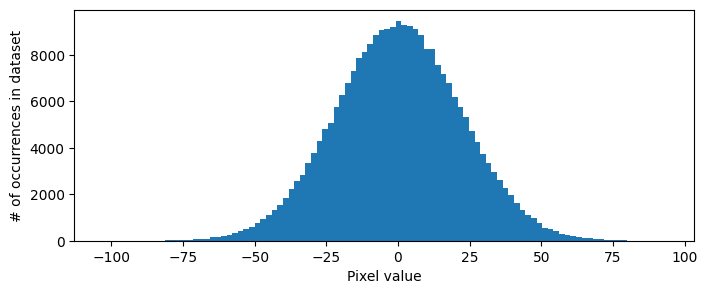

Batch mean: 0.203 Batch standard devation: 21.974


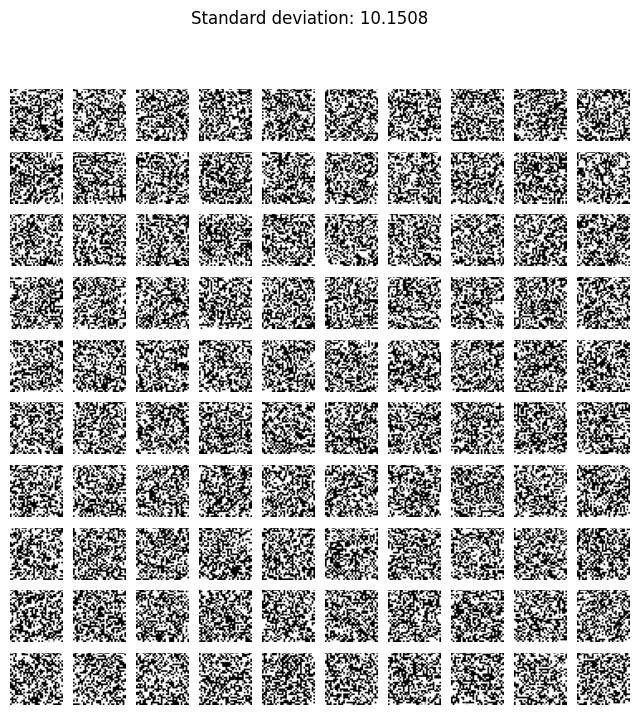

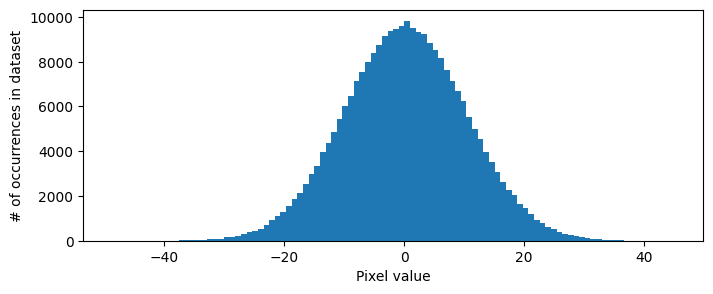

Batch mean: 0.211 Batch standard devation: 10.161


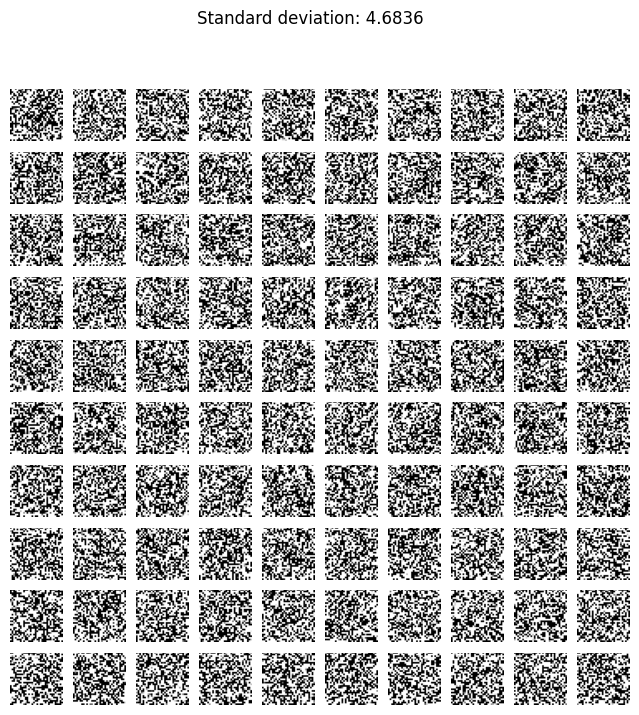

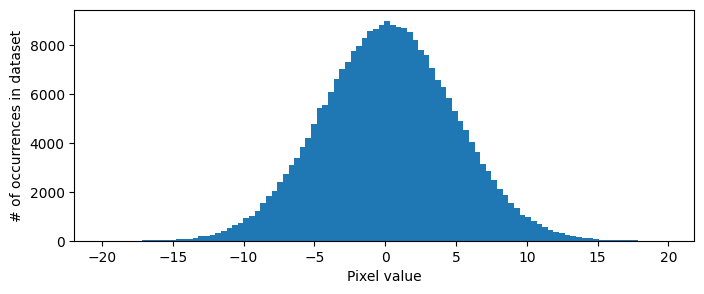

Batch mean: 0.215 Batch standard devation: 4.677


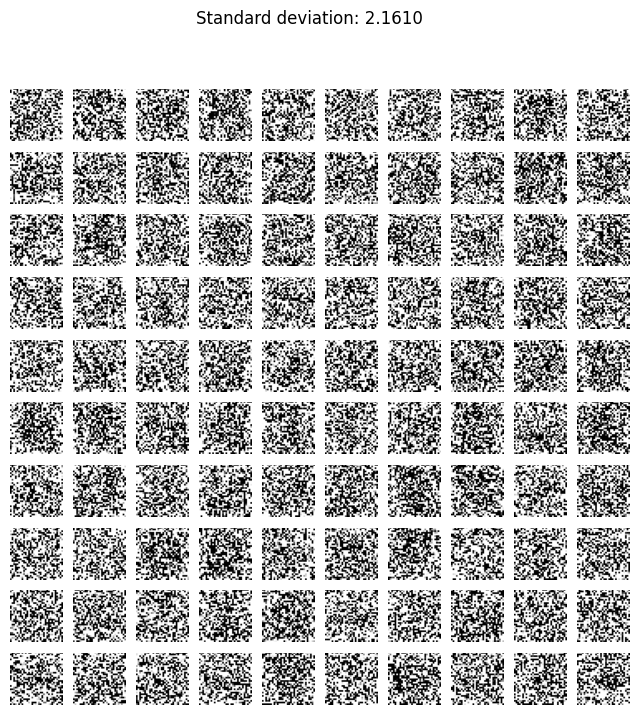

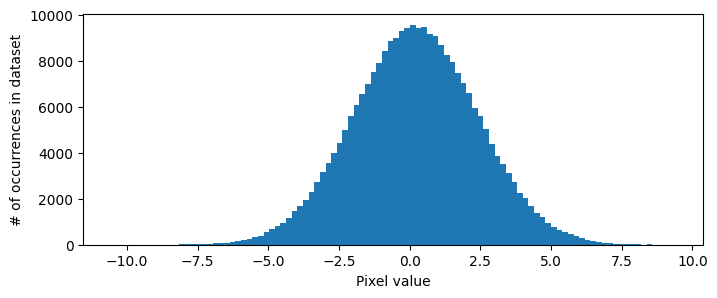

Batch mean: 0.214 Batch standard devation: 2.193


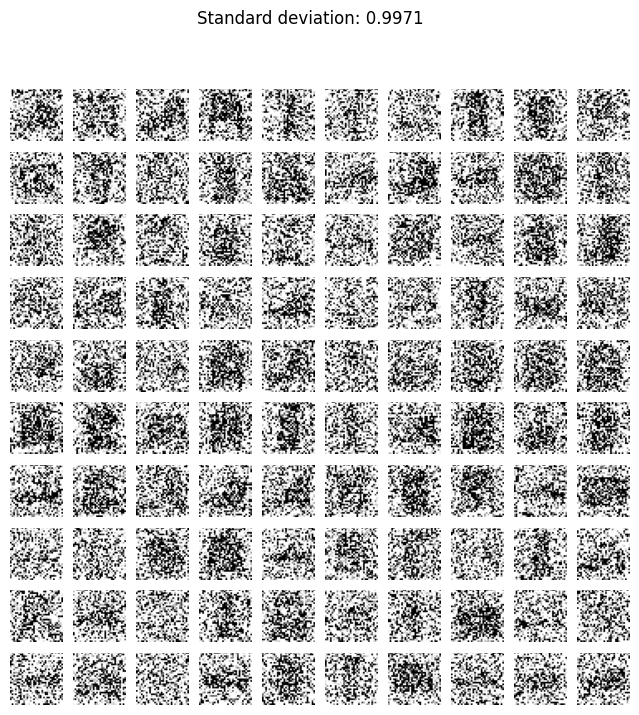

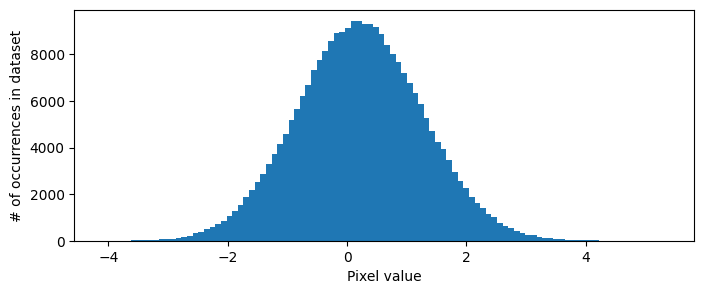

Batch mean: 0.217 Batch standard devation: 1.051


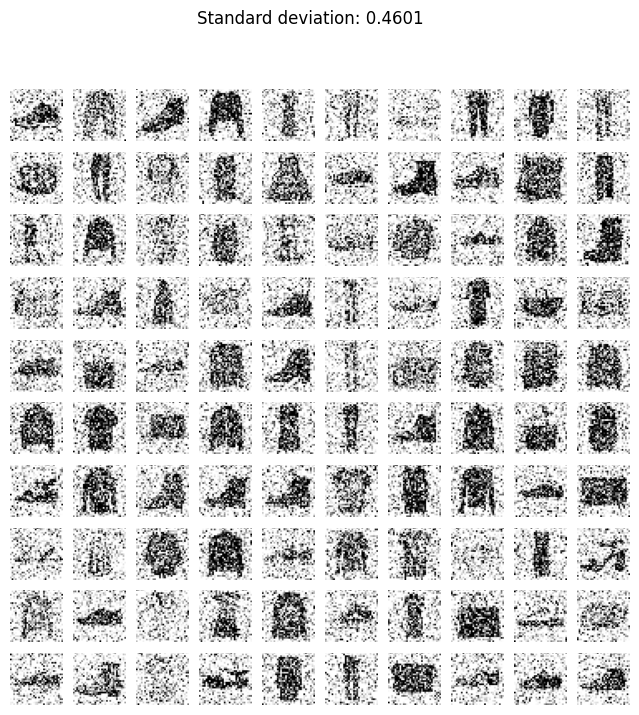

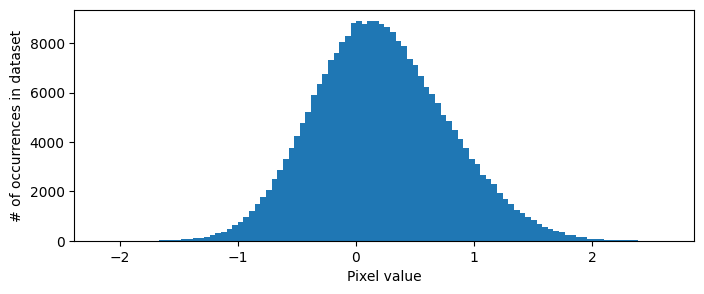

Batch mean: 0.216 Batch standard devation: 0.566


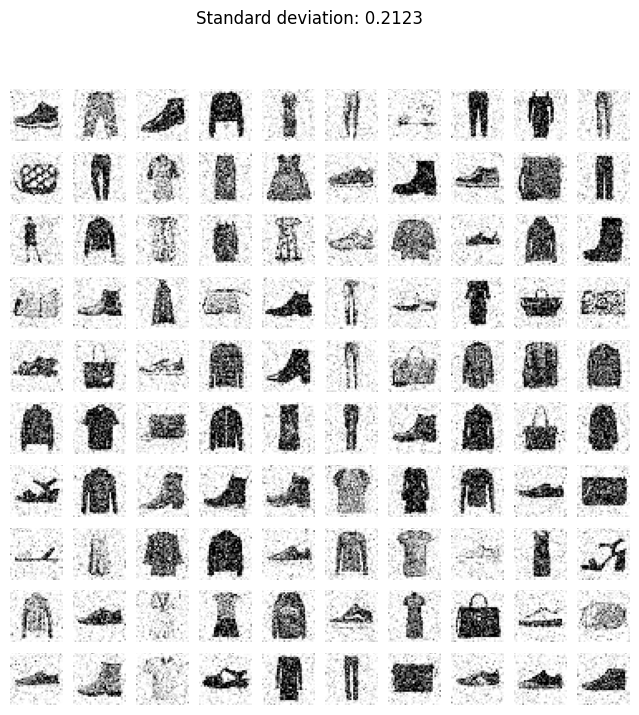

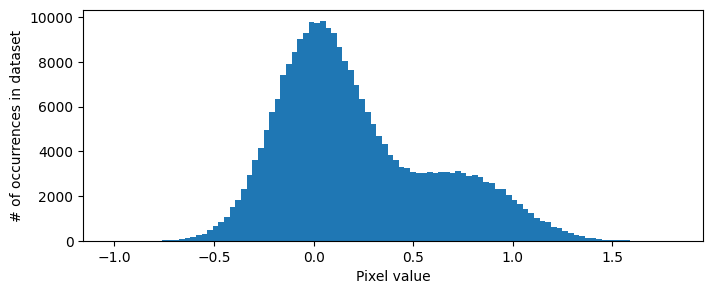

Batch mean: 0.217 Batch standard devation: 0.393


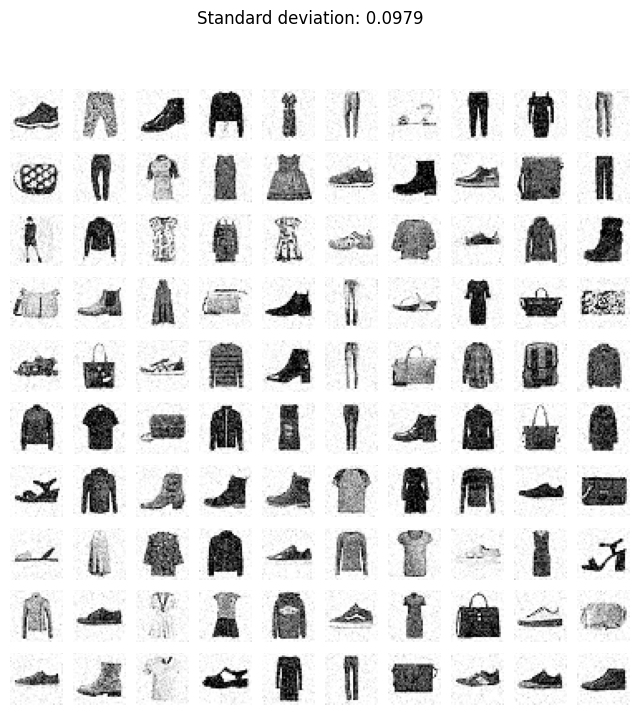

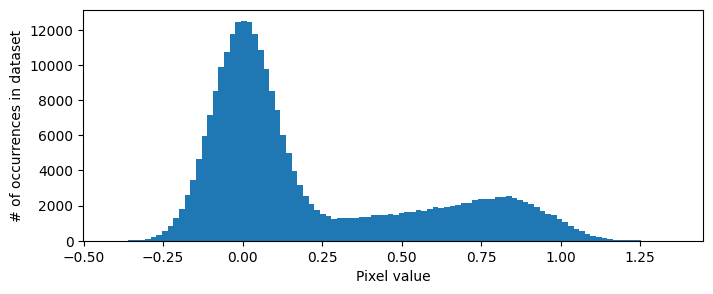

Batch mean: 0.215 Batch standard devation: 0.345


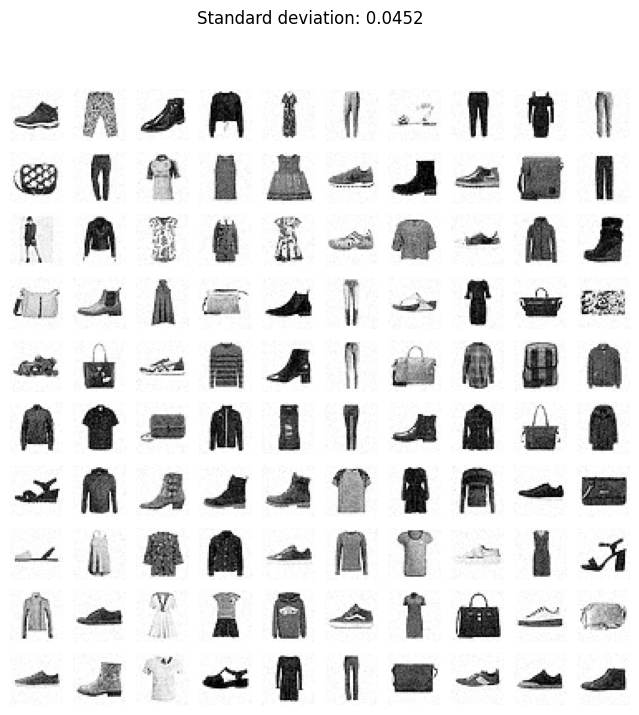

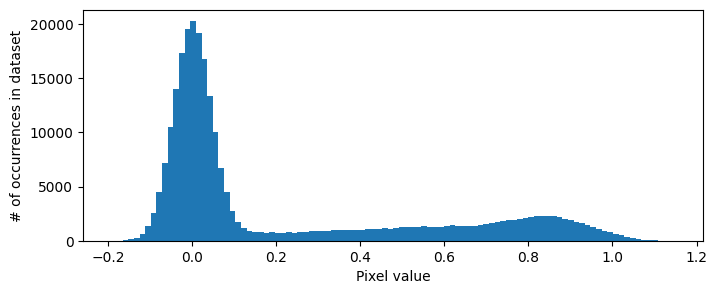

Batch mean: 0.215 Batch standard devation: 0.333


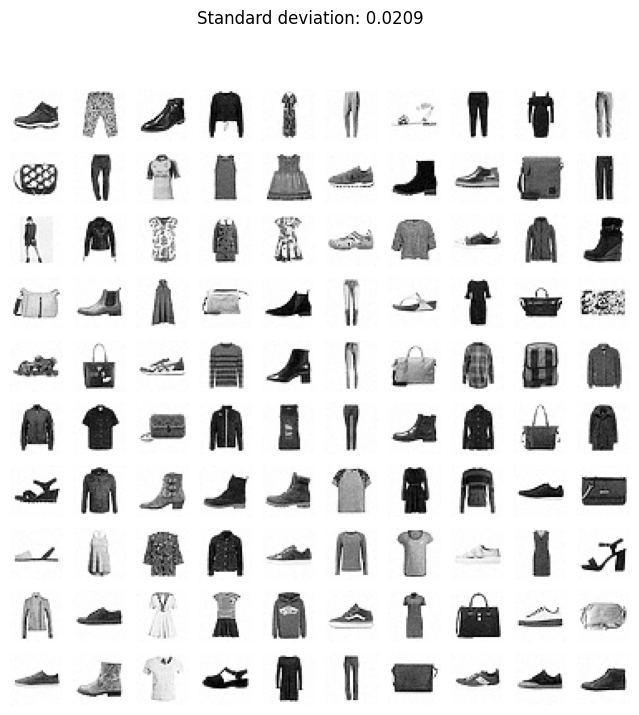

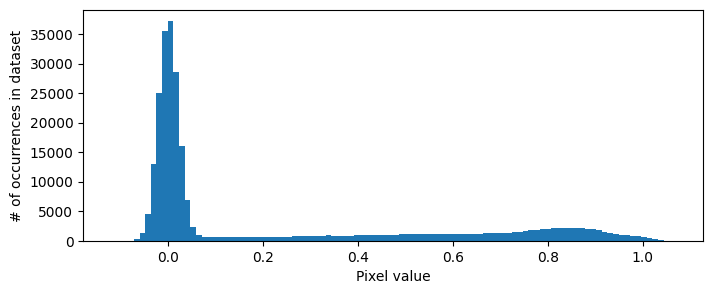

Batch mean: 0.215 Batch standard devation: 0.331


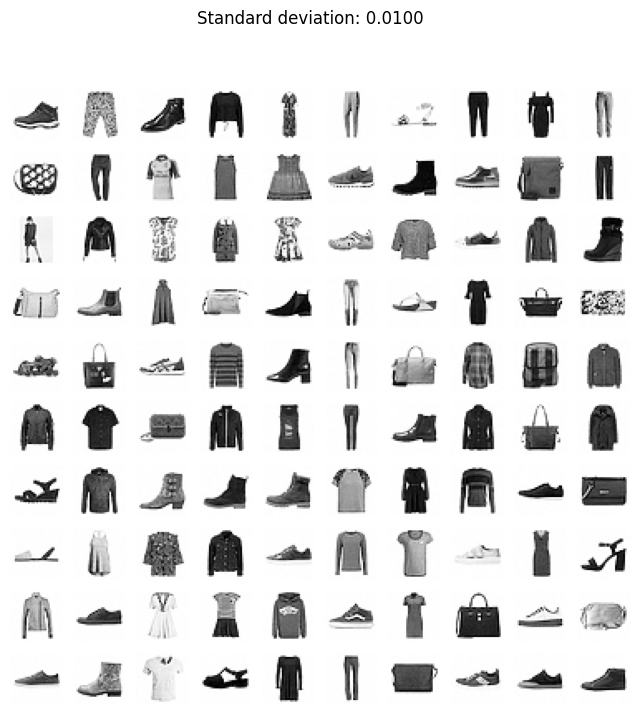

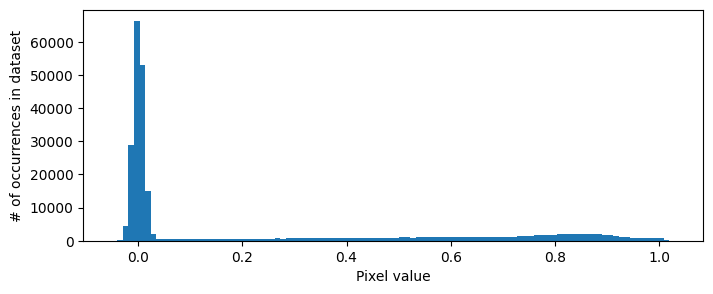

Batch mean: 0.215 Batch standard devation: 0.331


In [11]:
n_rows = 10

for sigma in list(noise_scales[::n_noise_scales // 10]) + [noise_scales[-1]]:
    noisy_imgs = input_batch + sigma*torch.randn(*input_batch.shape)
    plot_image_grid(noisy_imgs[:n_rows**2], figure_size=(8, 8), title=f"Standard deviation: {sigma:.4f}",
                    n_rows=n_rows)

    plt.figure(figsize=(8,3))
    plt.hist(noisy_imgs.numpy().reshape(-1), bins=100)
    plt.xlabel("Pixel value")
    plt.ylabel("# of occurrences in dataset")
    plt.show()
    batch_std, batch_mean = torch.std_mean(noisy_imgs)
    print(f"Batch mean: {batch_mean.item():.3f} Batch standard devation: {batch_std.item():.3f}")

## Model

We can finally build a model! This is a U-net style architecture, which is basically an encoder-decoder with _skip connections_ from the encoder to the decoder.
This is realized by the encoder using `return_all=True`, like we did to implement feature matching with GANs.
The decoder is set up to _receive_ skip connections via `receive_skips=True`, with the actual input handled by the `ScoreModel` implementation.

Another important note is the use of Group normalization, by supplying the `norm` argument with `block_kwargs`.
This replaces the default Batch normalization, which doesn't work well with score-based models, most likely due to the fact that we are solving many different problems (denoising levels) at once, which means we don't really have one population to compute batch statistics on.

In [12]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

level_filters = [32, 64, 128, 256]
level_strides = [1] + [2] * (len(level_filters) - 1)
blocks_per_level = 2
kernel_size = 3
activation = nn.Mish
n_levels = len(level_filters)

input_shape = next(iter(train_dataloader))[0].shape[1:]
input_pixels = input_shape[1]

input_channels = input_shape[0]
final_filters = level_filters[-1]

block_fn = ConvBlockPrenorm
block_kwargs = {"n_layers": 2, "activation": activation, "kernel_size": kernel_size,
                "use_se": True, "se_reduction_factor": 8, "se_bias": 1.,
                "use_residual": True, "bottleneck_factor": 1,
                "norm": nn.GroupNorm, "norm_groups": -8}

initial = nn.Conv2d(input_channels, level_filters[0], kernel_size, padding="same")
encoder = CNNBody(blocks_per_level, level_filters, level_strides,
                  input_channels=level_filters[0],
                  direction="down", block_fn=block_fn, return_all=True,
                  final_normact=False,
                  **block_kwargs)
decoder = CNNBody(blocks_per_level, list(reversed(level_filters)), list(reversed(level_strides)),
                  input_channels=final_filters,
                  direction="up", block_fn=block_fn, take_skips=True,
                  **block_kwargs)
head = nn.Conv2d(level_filters[0], input_channels, 1)

model = ScoreModel(initial, encoder, decoder, head,
                   input_shape, noise_scales, steps_per_sigma=t_per_noise_scale, epsilon=epsilon)

model = model.eval().to(device)
with torch.no_grad():
    test_output = model(next(iter(train_dataloader))[0].to(device))

print("test output shape")
print(test_output.shape, "\n")
if test_output.shape[1] != input_channels:
    raise ValueError(f"WARNING! Expected {input_channels} output channels but got {test_output.shape[1]}")
if test_output.shape[2] != input_pixels:
    raise ValueError(f"WARNING! Expected {input_pixels} output pixels but got {test_output.shape[2]}")

print(model)
model.compile()

Using cuda device
test output shape
torch.Size([256, 1, 32, 32]) 

ScoreModel(
  (root): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (encoder): CNNBody(
    (levels): ModuleList(
      (0): CNNLevel(
        (blocks): ModuleList(
          (0-1): 2 x ConvBlockPrenorm(
            (first_norm): GroupNorm(4, 32, eps=1e-05, affine=True)
            (layers): Sequential(
              (0): Mish()
              (1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (2): GroupNorm(4, 32, eps=1e-05, affine=True)
              (3): Mish()
              (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
            )
            (shortcut): Identity()
            (squeeze_excite): SqueezeExcite(
              (mapper): Sequential(
                (0): Linear(in_features=32, out_features=4, bias=True)
                (1): Mish()
                (2): Linear(in_features=4, out_features=32, bias=True)
     

In [13]:
num_params = count_parameters(model)
print(f"Model with {num_params:,d} trainable parameters")

Model with 7,235,633 trainable parameters


## Training

We showcase here _learning rate warmup_, which was recently added to the repository.
This starts with a _small_ learning rate and quickly increases it so some maximum, after which the usual decay kicks in.
This is supposed to stabilize the early training phase and allow for larger learning rates overall.

In [14]:
ema = EMA(model, 0.999)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.1, amsgrad=False)

n_epochs = 200
warmup_epochs = 5
decay_epochs = n_epochs - warmup_epochs
warmup_steps = warmup_epochs * len(train_dataloader)
decay_steps = decay_epochs * len(train_dataloader)

scheduler = cosine_decay_warmup(optimizer, decay_steps, warmup_steps)

trainer = ScoreTrainer(model=model, optimizer=optimizer, scheduler=scheduler, ema=ema, decay_style="step",
                       training_loader=train_dataloader, validation_loader=test_dataloader,
                       n_epochs=n_epochs, plot_every_n_epochs=25,
                       device=device, verbose=True)

In [ ]:
metrics = trainer.train_model()

## Evaluation

When trying to evaluate based on samples (which all the accepted methods do -- FID, Inception Score, Precision-Recall...), the main weakness of score-based models comes in:
Generation takes a _very_ long time.
With the given parameters, generating 50,000 samples takes over half an hour on an A40 GPU.
For larger datasets and corresponding models, it can take several hours even to generate 10,000 samples, i.e. we would have to reserve a day or more even just for a proper evaluation of the model.

Still, the actual results are very good. With our parameters, we got an FID score of around 1.8, and a larger model should be better still.
An Inception score of more than 7 approaches what our homegrown classifier would return for the _real_ test data.

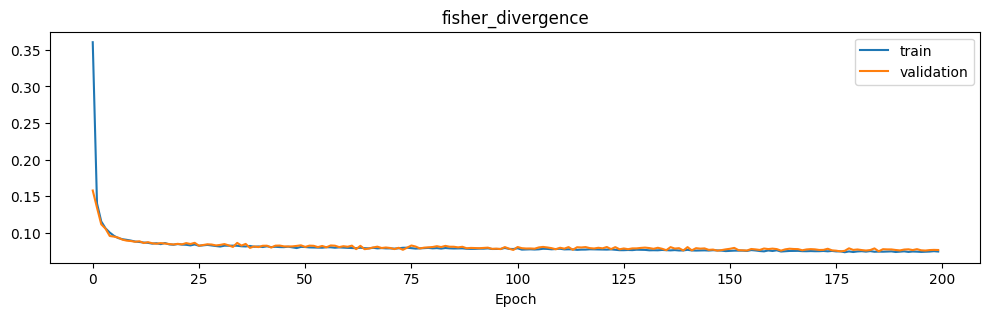

In [16]:
plot_learning_curves(metrics, ["fisher_divergence"])

### FID etc.

In [17]:
classifier = get_classifier(data, "weights").to(device).eval()
feature_extractor = classifier[:-3].eval()
head = classifier[-3:].eval()

In [18]:
def generate_wrap(n_samples):
    with torch.inference_mode():
        gens = model.generate(n_samples)
        return torch.clamp(gens, 0, 1)

fid_score, real_features, generated_features = fid(feature_extractor, test_dataloader, generate_wrap, n_samples=50000,
                                                   return_features=True, use_tqdm=True)
print(f"FID score: {fid_score:.5f}")

Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [19]:
inception_score_with_features(head, generated_features, batch_size)

NameError: name 'generated_features' is not defined

In [ ]:
precision_recall(real_features, generated_features, batch_size, 5, use_tqdm=True)

### Denoising (or not)
One very important aspect of score-based models is that the generations will still contain noise at whatever `min_noise` we picked.
Evaluation measures like FID can be highly sensitive to this noise.
This is why the `model.generate` function has a a `denoise` argument that is set to `True` by default.
We can see what happens if we set it to False.

Here we get an FID score of 80! This is worse than pretty much anything we have seen so far, even than the blurry standard VAEs or messed-up GANs.
This is despite the fact that the noise is barely visible to the naked eye.
This points to important subtleties when evaluating generative models.

We also found precision & recall to reduce heavily, with the Inception score being more robust (but still slightly worse).

In [ ]:
def generate_wrap_nd(n_samples):
    with torch.inference_mode():
        gens = model.generate(n_samples, denoise=False)
        return torch.clamp(gens, 0, 1)

fid_score_nd, real_features_nd, generated_features_nd = fid(feature_extractor, test_dataloader, generate_wrap_nd, n_samples=50000,
                                                            return_features=True, use_tqdm=True)
print(f"FID score without denoising: {fid_score_nd:.5f}")

In [ ]:
inception_score_with_features(head, generated_features_nd, batch_size)

In [ ]:
precision_recall(real_features_nd, generated_features_nd, batch_size, 5, use_tqdm=True)

### EMA
Finally, EMA is supposed to be particularly strong for score-based models.
We found only a slight improvement, but it may be more powerful for more challenging datasets.
You don't need to invest another 30-60 minutes for evaluation here if you don't want to.

In [ ]:
ema.apply_parameters()

fid_score_ema, real_features_ema, generated_features_ema = fid(feature_extractor, test_dataloader, generate_wrap, n_samples=50000,
                                                   return_features=True, use_tqdm=True)
print(f"FID score after EMA (with denoising): {fid_score_ema:.5f}")

In [ ]:
inception_score_with_features(head, generated_features_ema, batch_size)

In [ ]:
precision_recall(real_features_ema, generated_features_ema, batch_size, 5, use_tqdm=True)

In [ ]:
ema.apply_backup()

In [ ]:
torch.save(model.state_dict(), "weights/score_fashion.pt")

In [ ]:
model.load_state_dict(torch.load("weights/score_fashion.pt"))

## Sensitivity to epsilon

The generate function we implemented allows for changing the `epsilon` value, i.e. the base step size for sampling.
Here we try a range from 1/10th to 10 times the chosen value, increasing roughly by a factor of 3.

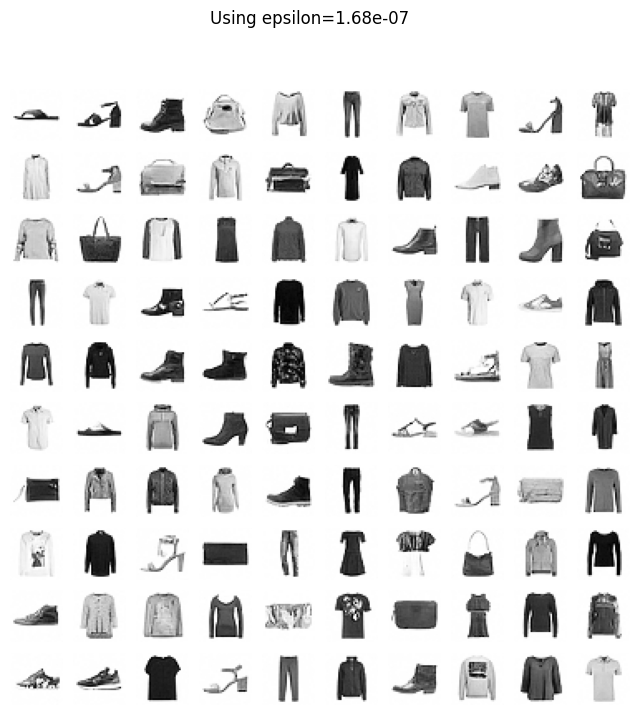

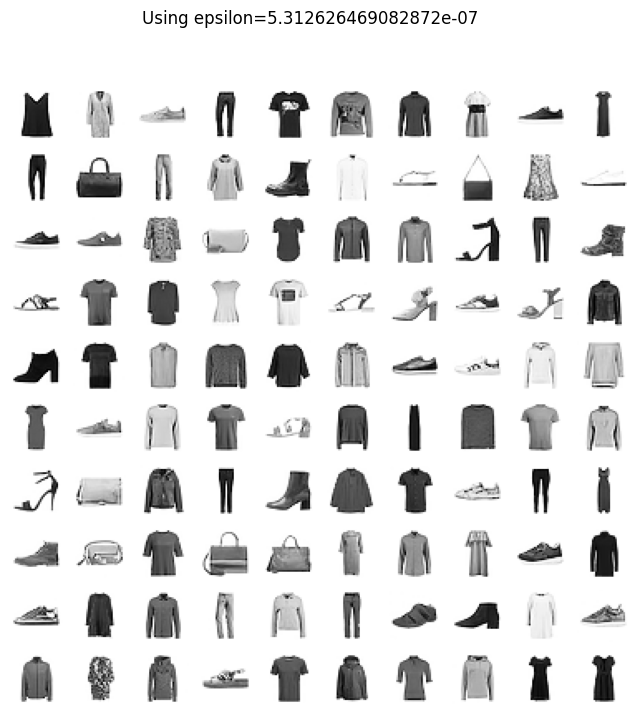

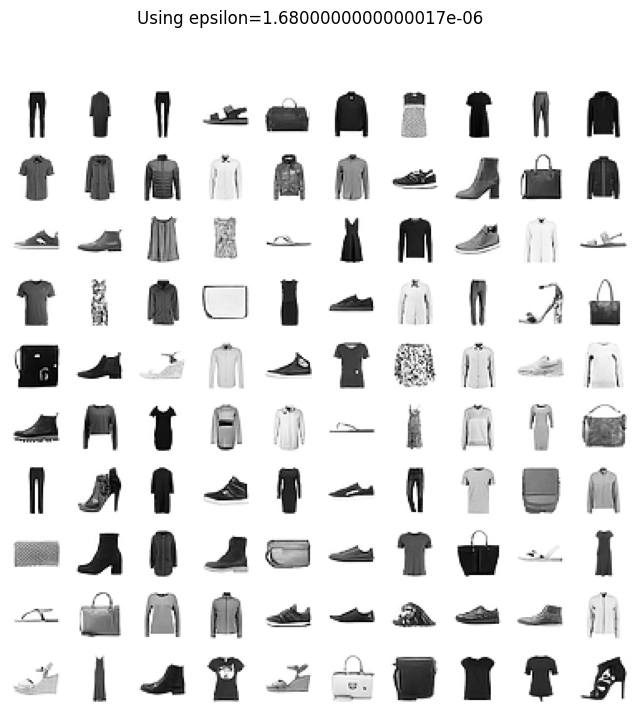

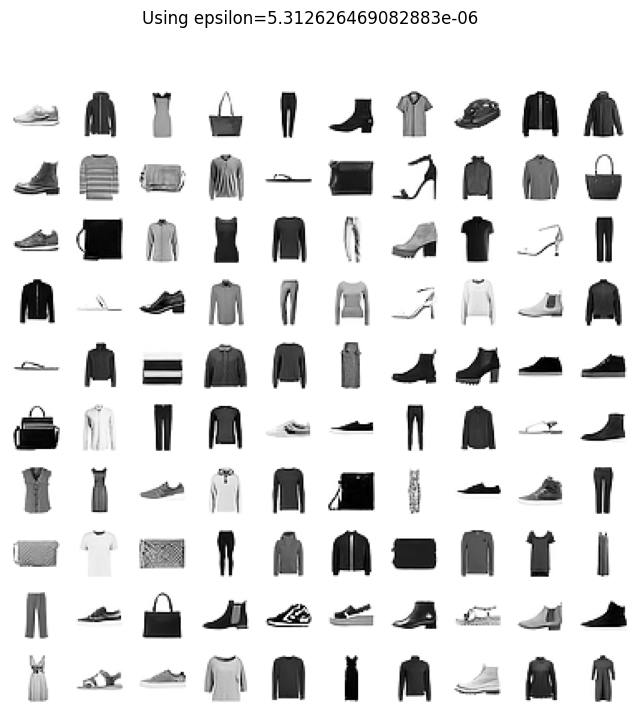

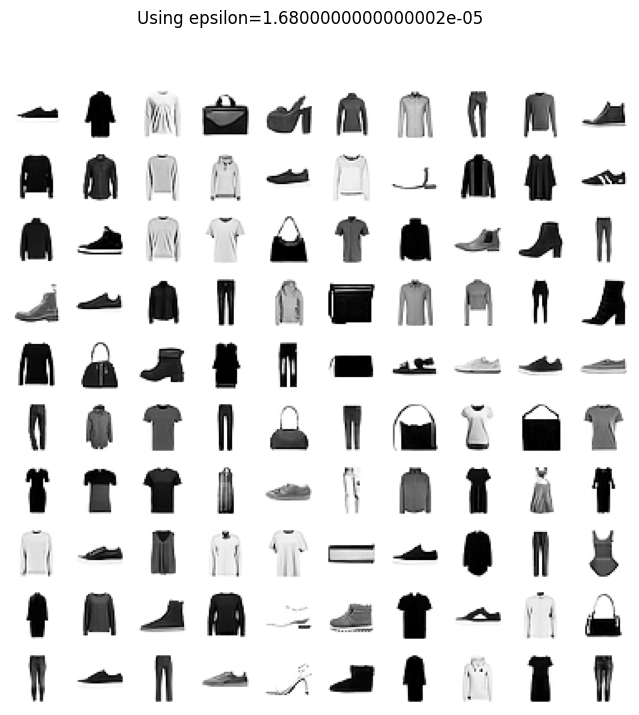

In [22]:
n_rows = 10
with torch.inference_mode():
    for var_eps in np.geomspace(epsilon/10, 10*epsilon, 5):
        eps_samples = model.generate(n_rows**2, epsilon=var_eps)
        plot_image_grid(eps_samples, (8, 8), f"Using epsilon={var_eps}", n_rows)

### Number of steps
We can also try different `steps_per_sigma` for our originally chosen `epsilon`. Less than 3 seems a really bad idea...

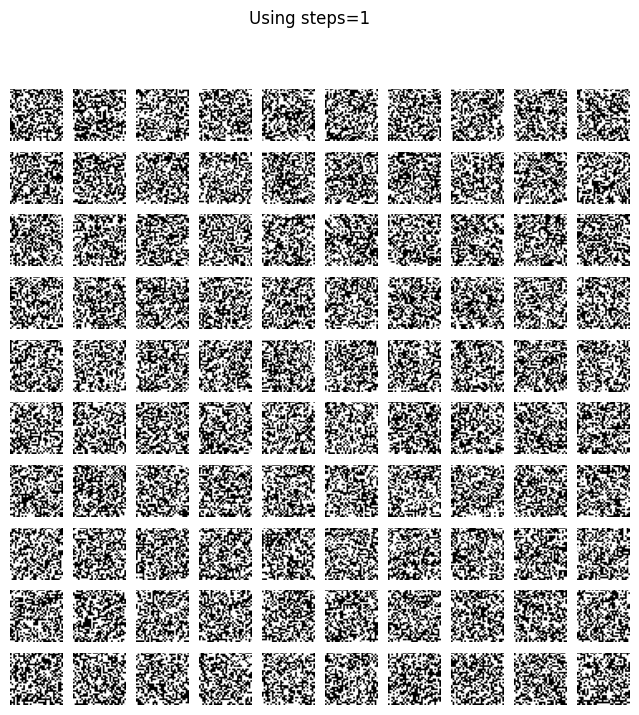

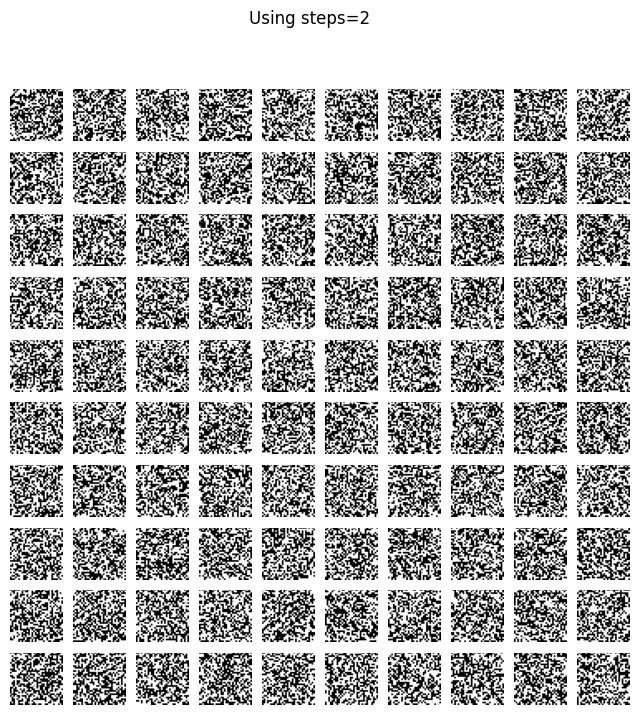

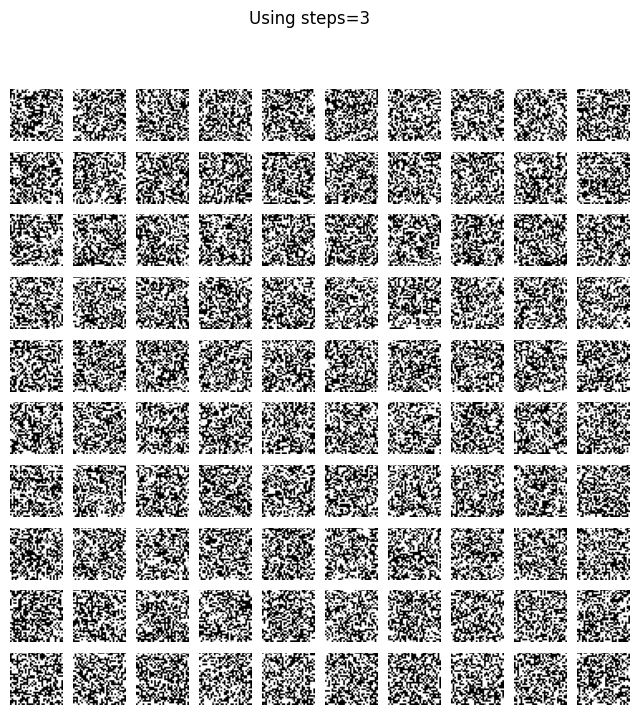

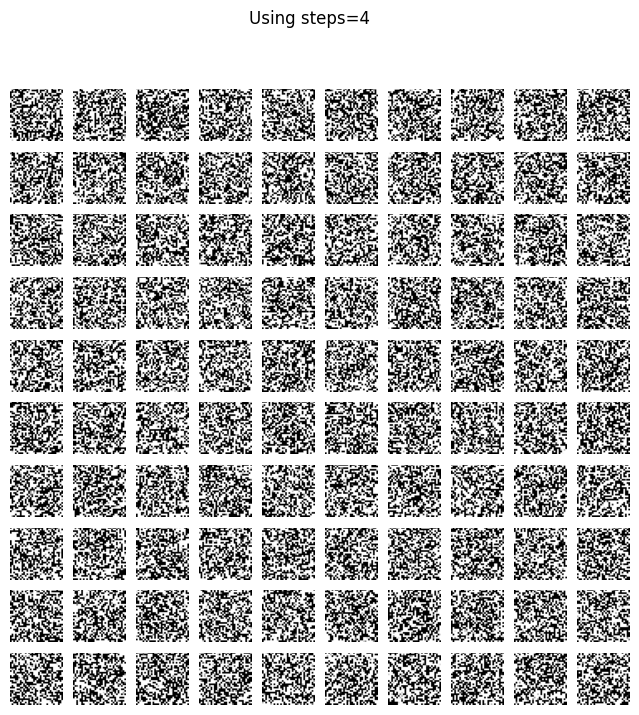

In [23]:
n_rows = 10
with torch.inference_mode():
    for t_steps_per in range(1, 5):
        eps_samples = model.generate(n_rows**2, steps_per_sigma=t_steps_per)
        plot_image_grid(eps_samples, (8, 8), f"Using steps={t_steps_per}", n_rows)

## Fun with Generations

We can do quite a few different things with the score-based iterative generation approach.
For this purpose, we wrote one giant function that handles all sort of special cases.
First the basic generation as a sanity check:

No mask or start samples -- random generation mode!


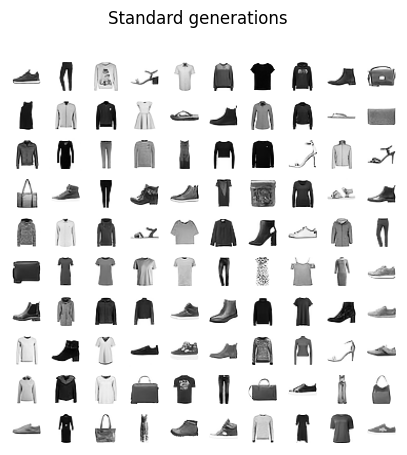

In [24]:
n_rows = 10
with torch.inference_mode():
    generated = generate_omega(model, n_samples=n_rows**2)
plot_image_grid(generated, (5,5), "Standard generations", n_rows)

### Partial Denoising
We can create partially "noisified" data by adding noise with a specific standard deviation, and then run the generation only _starting with that standard deviation_.
This will result in outputs that look similar to the original data, but will usually differ in details.
The stronger the "noisification", the weaker the similarity will usually be.

Looking at the proportions shows a bit of an issue here; many of the later noise levels are already so close to the data that there is barely any noise.
Even at the halfway point, there is relatively little noise.
And yet, at the 25% point, there is barely anything left, and the "reconstructions" have little to do with the original data.
This is due to the exponentially growing noise levels.
There is a small period between around 30-50% of the noise schedule where we can get variations on the original inputs that are meaningfully different, yet still recognizable.

The best values here may differ beween datasets. For example, for 64x64 Flickr, I found that 50% is already very far removed from the data, and something like 60% is more appropriate. Experiment!

In [25]:
test_batch = next(iter(test_dataloader))[0].to(device)

Proportion of way to data: 0.75
Sigma index 150


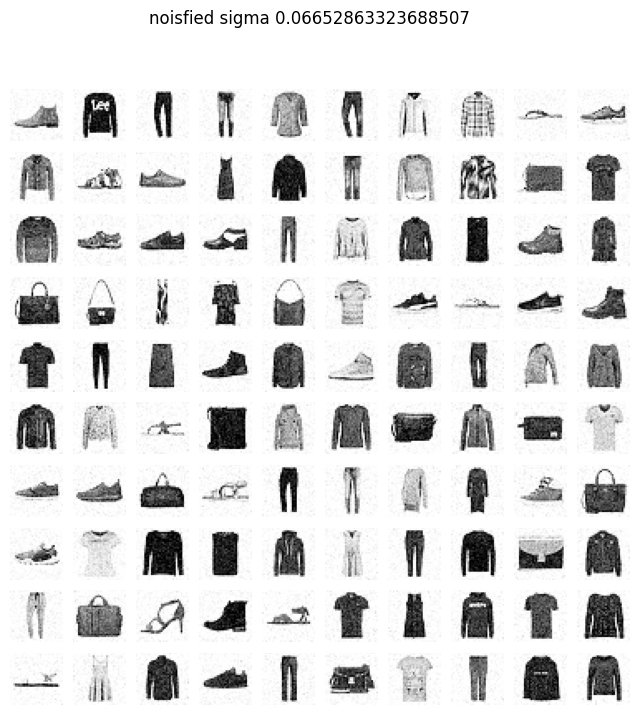

Start samples detected -- partial denoising mode!


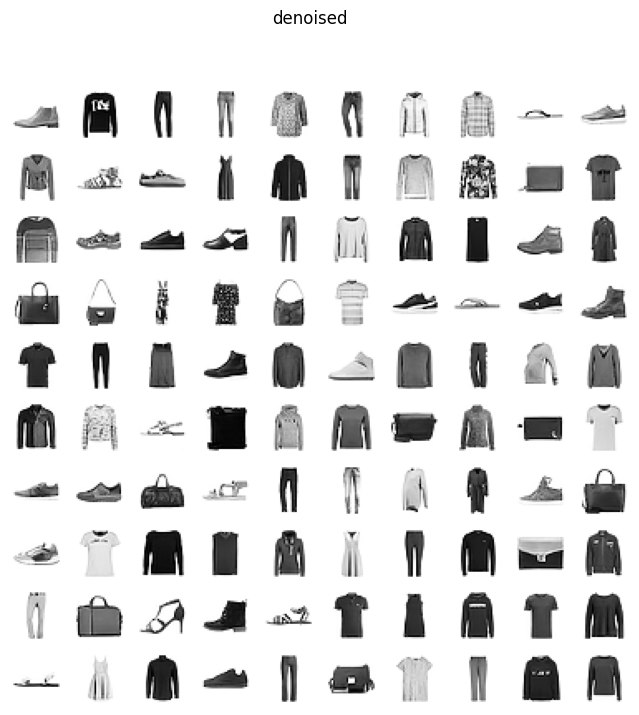

Proportion of way to data: 0.5
Sigma index 100


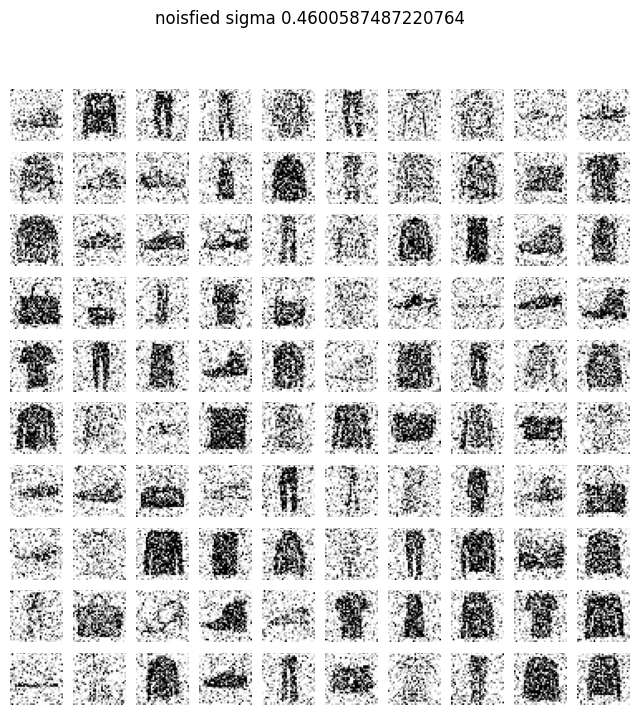

Start samples detected -- partial denoising mode!


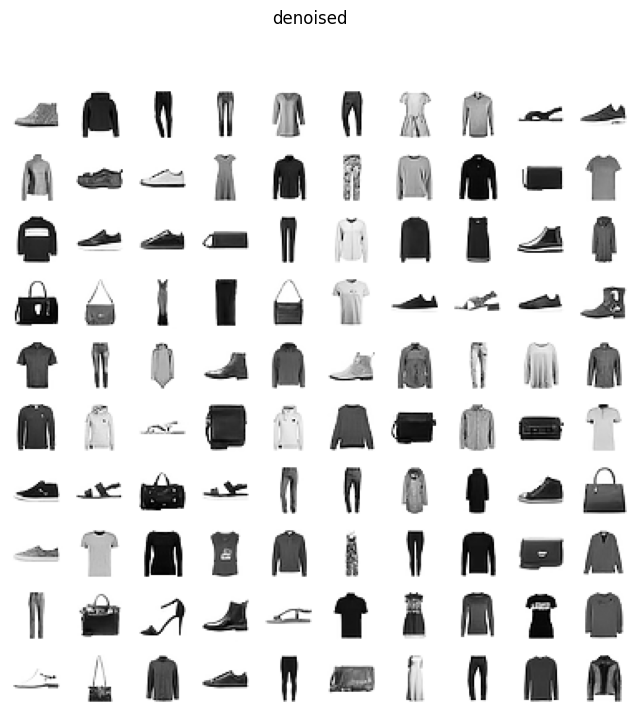

Proportion of way to data: 0.4
Sigma index 80


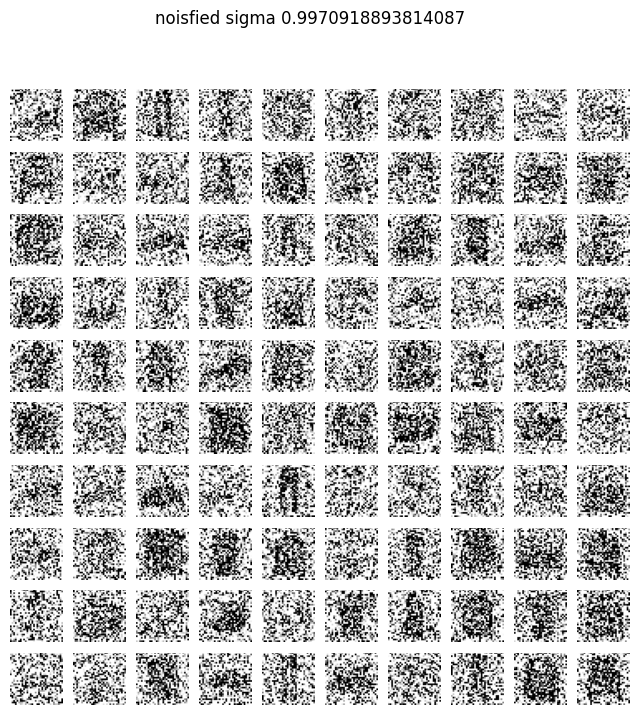

Start samples detected -- partial denoising mode!


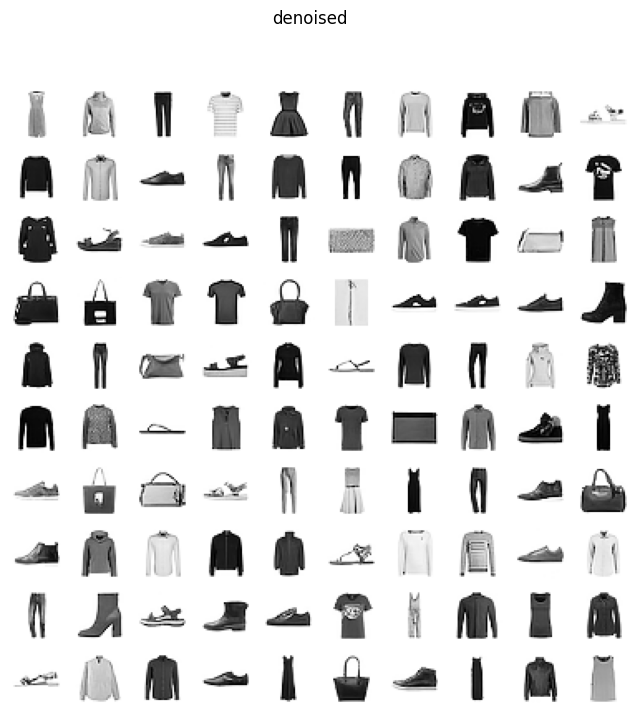

Proportion of way to data: 0.3
Sigma index 60


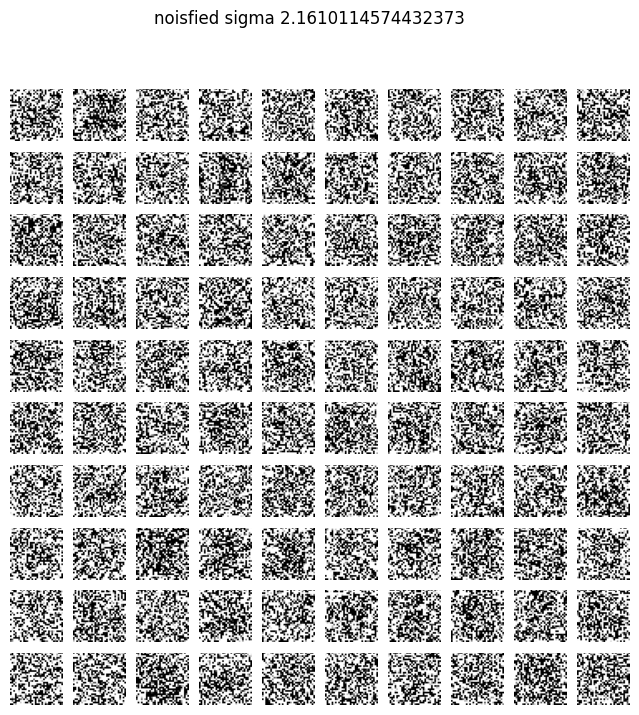

Start samples detected -- partial denoising mode!


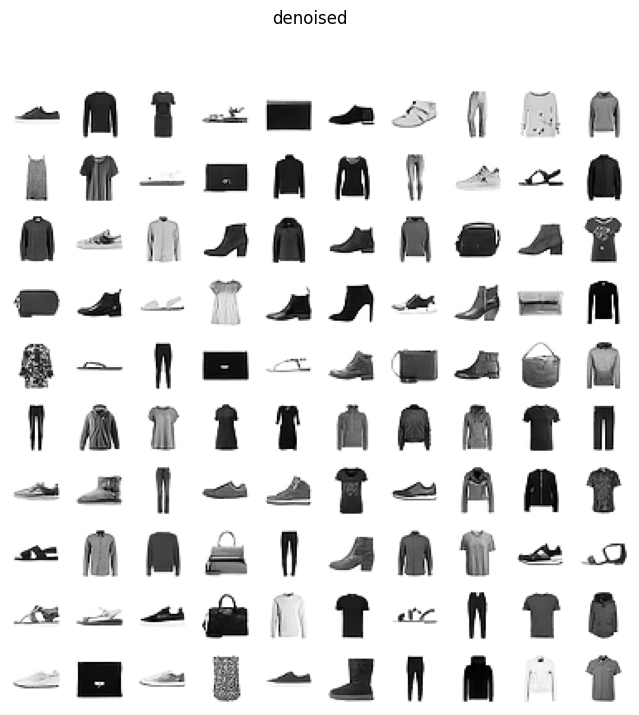

Proportion of way to data: 0.25
Sigma index 50


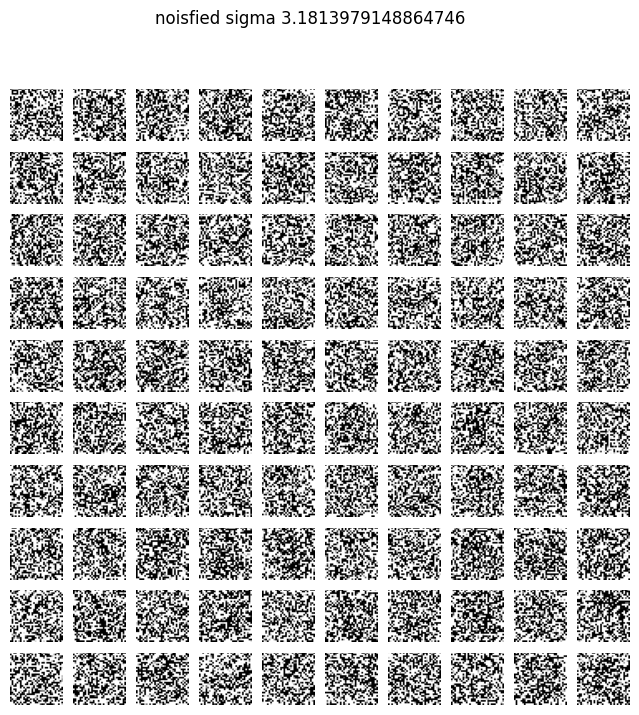

Start samples detected -- partial denoising mode!


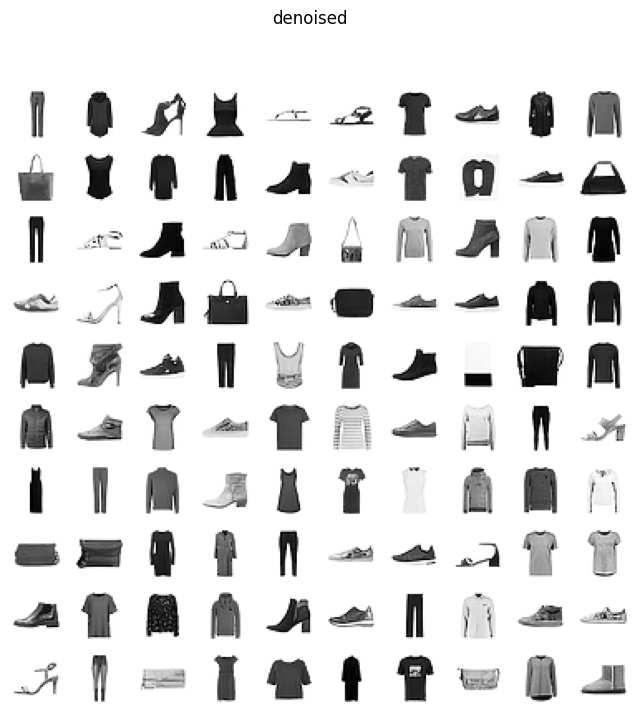

Proportion of way to data: 0.1
Sigma index 20


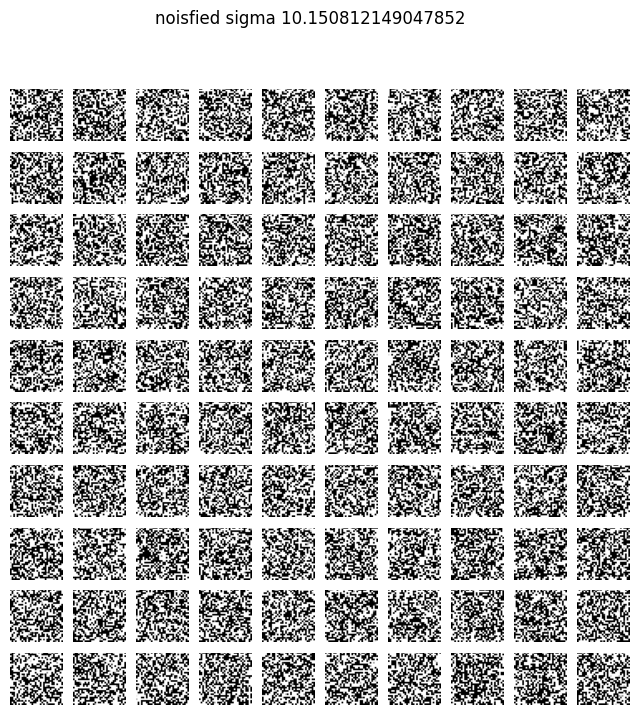

Start samples detected -- partial denoising mode!


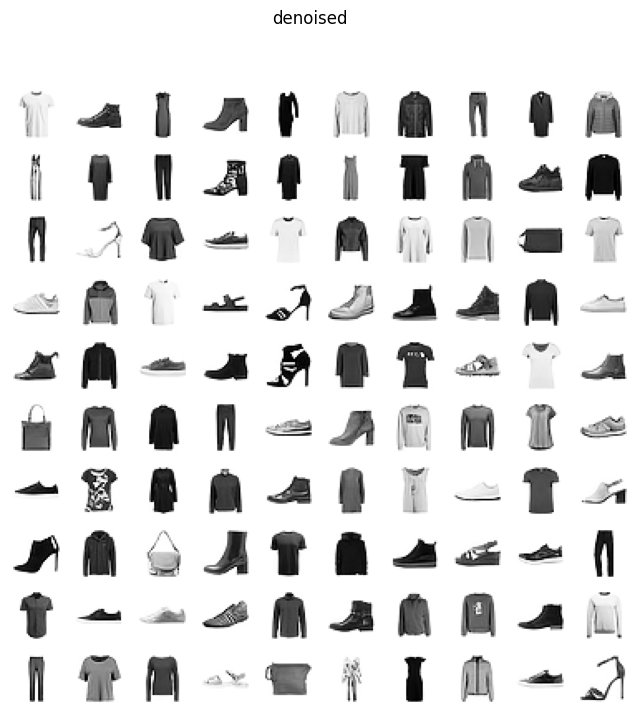

In [26]:
def noise_denoise(model, inputs, sigma_index, n_rows):
    sigma = model.sigma_sequence[sigma_index]
    noisy = (inputs + sigma * torch.randn_like(inputs))[:n_rows**2]
    plot_image_grid(noisy, (8, 8), f"noisfied sigma {sigma.item()}", n_rows)
    with torch.inference_mode():
        denoised = generate_omega(model, start_samples=noisy, start_sigma_index=sigma_index+1)
    plot_image_grid(denoised, (8, 8), "denoised", n_rows)

for proportion in [0.75, 0.5, 0.4, 0.3, 0.25, 0.1]:
    print(f"Proportion of way to data: {proportion}")
    closest_index = int(proportion * len(model.sigma_sequence))
    print(f"Sigma index {closest_index}")
    noise_denoise(model, test_batch, closest_index, n_rows)

### Visualizing Markov Chains
We can show the entire generation process from noise to data. This is pretty much pointless, but looks cool!

Note: For greyscale images (single-channel), we invert the colors as we want 0 (background) to be shown as white and 1 as dark colors.

In [29]:
n_rows = 10

with torch.inference_mode():
    full_chain = generate_omega(model, n_samples=n_rows**2, return_sequence=True)

No mask or start samples -- random generation mode!


OutOfMemoryError: CUDA out of memory. Tried to allocate 2.00 MiB. GPU 0 has a total capacity of 10.57 GiB of which 2.06 MiB is free. Process 1075201 has 2.54 GiB memory in use. Process 1193726 has 8.03 GiB memory in use. Of the allocated memory 7.31 GiB is allocated by PyTorch, and 528.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
first_sample_chain = torch.stack([torch.clamp(step[0], 0, 1) for step in full_chain], dim=0)
if input_channels == 1:
    first_sample_chain = 1 - first_sample_chain
make_animation("score_chain", first_sample_chain, frame_rate=60)

The above is only one sample. We can do better...

In [ ]:
chain_stacked = []
for step in full_chain:
    # thx chatgpt
    step = step.view(n_rows, n_rows, input_channels, input_pixels, input_pixels)
    step = step.permute(2, 0, 3, 1, 4)
    step = step.reshape(input_channels, n_rows * input_pixels, n_rows * input_pixels)
    chain_stacked.append(step)
    
chain_stacked = torch.clamp(torch.stack(chain_stacked, dim=0), 0, 1)
if input_channels == 1:
    chain_stacked = 1 - chain_stacked
make_animation("score_chain_stacked", chain_stacked, frame_rate=60)

### Inpainting
Since this worked so very well for the Flow models... we can try inpainting again.
The good thing is that we actually have a sort of principled way of doing it this time.
Namely, we generate as normal, but after each step, we replace the non-masked parts of the generation by a noisy version (with the correct amount of noise) of our desired targets.
This ensures that, as generation progresses, the non-masked parts of the output will resemble the non-masked parts of the targets.
The masked parts, on the other hand, will hopefully generate sensible features that well match the rest of the image.

This actually works reasonably well for FashionMNIST. For 64x64 Flickr, I found results to be very unreliable. Sometimes it works okay; often it will just generate garbled colorful noise.

In [ ]:
mask_left = torch.ones(1, 32, 16)
mask_right = torch.zeros(1, 32, 16)
mask = torch.cat((mask_left, mask_right), dim=2)

plt.imshow(mask.numpy().transpose(1, 2, 0), cmap="Greys_r")
plt.colorbar()
plt.show()

In [ ]:
with torch.inference_mode():
    inpainted = generate_omega(model, start_samples=test_batch, mask=mask.to(device))

In [ ]:
plot_image_grid(test_batch[:n_rows**2], (8, 8), "original", n_rows)
plot_image_grid(test_batch[:n_rows**2] * mask.to(device), (8, 8), "masked", n_rows)
plot_image_grid(inpainted[:n_rows**2], (8, 8), "inpainted", n_rows)

In [ ]:
--